<a href="https://colab.research.google.com/github/pulkit22022000/UNSW_Projects/blob/main/cartoPy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install fontTools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 965 kB 6.5 MB/s 


In [3]:
pip uninstall shapely

Found existing installation: Shapely 1.8.5.post1
Uninstalling Shapely-1.8.5.post1:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/Shapely-1.8.5.post1.dist-info/*
    /usr/local/lib/python3.7/dist-packages/Shapely.libs/libgeos-35e678a0.so.3.10.3
    /usr/local/lib/python3.7/dist-packages/Shapely.libs/libgeos_c-c8ec7514.so.1.16.1
    /usr/local/lib/python3.7/dist-packages/shapely/*
Proceed (y/n)? y
  Successfully uninstalled Shapely-1.8.5.post1


In [4]:
pip install shapely --no-binary shapely

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 200 kB 6.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for shapely: filename=Shapely-1.8.5.post1-cp37-cp37m-linux_x86_64.whl size=669758 sha256=82db96b2110c043a1a3a93472b44c72c3f8cab25952bd1e3f452a8d0efe531db
  Stored in directory: /root/.cache/pip/wheels/a3/07/7c/cc50e8ecc795963726466b22ecd395ee1e2a28da87a4cdeb56
Successfully built shapely


In [5]:
!pip install cartopy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.8 MB 7.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 35.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 38.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 71.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 12.1 MB 59.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 46 kB 4.7 MB/s 
  Created wheel for cartopy: filename=Cartopy-0.19.0.post1-cp37-cp37m

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from fontTools.merge import cmap
from sklearn.cluster import KMeans
from sklearn import metrics
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter  
import matplotlib.ticker as mticker 
from cartopy import feature as cfeature
import plotly.express as px

In [7]:
df_data = pd.read_csv('/content/drive/MyDrive/drifting_longlines.csv')
df_use = df_data[['lat', 'lon']]

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
df_data.dropna(inplace=True)

In [9]:
df_use.dropna(inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


In [10]:
df_data.isnull().sum()

vessel_num             0
timestamp              0
distance_from_shore    0
distance_from_port     0
speed                  0
course                 0
lat                    0
lon                    0
is_fishing             0
source                 0
dtype: int64

In [11]:
df_data.isnull().sum()

vessel_num             0
timestamp              0
distance_from_shore    0
distance_from_port     0
speed                  0
course                 0
lat                    0
lon                    0
is_fishing             0
source                 0
dtype: int64

In [12]:
X = df_use.to_numpy()

k = 5

# Formalize the model
model1 = KMeans(n_clusters=k)
# run the model
model1.fit(X)
# need to know what parameters each category has
C_i = model1.predict(X)
# need to know the coordinates of the cluster center
Muk = model1.cluster_centers_



# plt.scatter(X[:,0],X[:,1],c=C_i,cmap=plt.cm.Paired, s = 0.5 )
#
# # plot the cluster center
# plt.scatter(Muk[:,0],Muk[:,1],marker='*',s=60)
# for i in range(k):
#     plt.annotate('center'+str(i + 1),(Muk[i,0],Muk[i,1]))
# plt.show()

In [13]:
X

array([[ 14.86558342, -26.85366249],
       [ 14.86386967, -26.85680008],
       [ 14.86155128, -26.86064911],
       ...,
       [-26.90320587, -41.53355408],
       [-26.8961792 , -41.52838516],
       [-26.89509583, -41.52780533]])

In [14]:
df_use

,lat,lon
0,14.865583,-26.853662
1,14.863870,-26.856800
2,14.861551,-26.860649
3,14.822686,-26.865898
4,14.821825,-26.867579
...,...,...
1048570,-26.913244,-41.541027
1048571,-26.905119,-41.535133
1048572,-26.903206,-41.533554
1048573,-26.896179,-41.528385


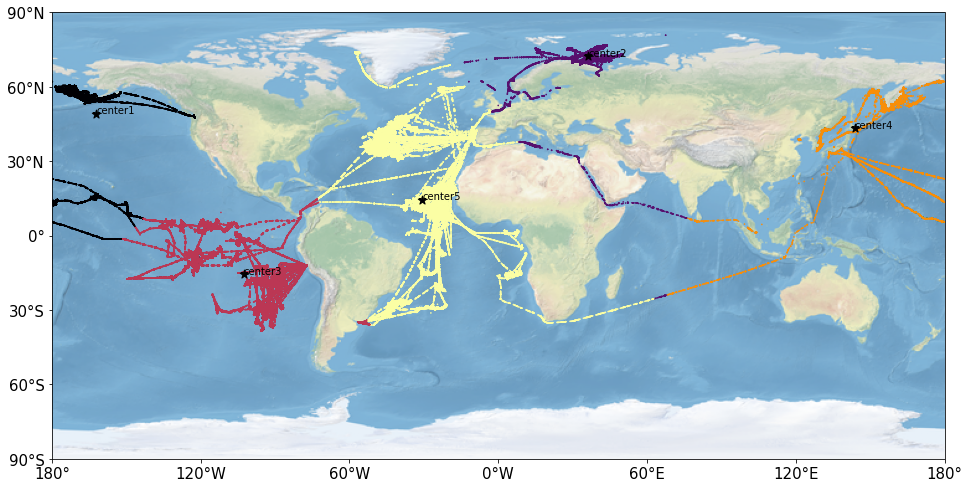

In [15]:
fig = plt.figure(figsize=(16, 10))  

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

extent = [-180, 180, -90, 90]

dx = 60
dy = 30
offset = min(dx, dy)

xticks = np.arange(extent[0], extent[1] + offset, dx)  
yticks = np.arange(extent[2], extent[3] + offset, dy)  

ax.set_xticks(xticks, crs=ccrs.PlateCarree())
ax.set_yticks(yticks, crs=ccrs.PlateCarree())

ax.tick_params(labelsize=15)

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.set_extent(extent)

plt.scatter(X[:,1],X[:,0],
            s = 0.4,c=C_i,
            cmap=plt.cm.inferno,
            transform=ccrs.Geodetic(),
           )


plt.scatter(Muk[:,1],Muk[:,0],
            marker='*',s=80,color = 'k',
            transform=ccrs.Geodetic(),
           )

for i in range(k):
    plt.annotate('center'+str(i + 1),(Muk[i,1],Muk[i,0]))
plt.show()


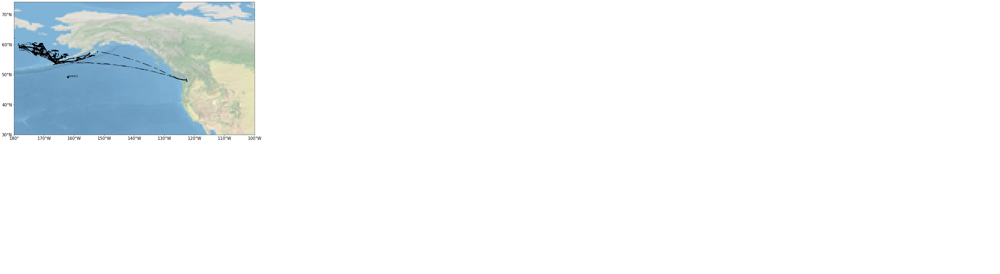

In [16]:

fig = plt.figure(figsize=(16, 10))  

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

extent = [-180, -100, 30, 70]

dx = 10
dy = 10
offset = min(dx, dy)

xticks = np.arange(extent[0], extent[1] + offset, dx)  
yticks = np.arange(extent[2], extent[3] + offset, dy)  

ax.set_xticks(xticks, crs=ccrs.PlateCarree())
ax.set_yticks(yticks, crs=ccrs.PlateCarree())

ax.tick_params(labelsize=15)

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.set_extent(extent)

plt.scatter(X[:,1],X[:,0],
            s = 0.4,c=C_i,
            cmap=plt.cm.inferno,
            transform=ccrs.Geodetic(),
           )


plt.scatter(Muk[:,1],Muk[:,0],
            marker='*',s=80,color = 'k',
            transform=ccrs.Geodetic(),
           )

for i in range(k):
    plt.annotate('center'+str(i + 1),(Muk[i,1],Muk[i,0]))
plt.show()

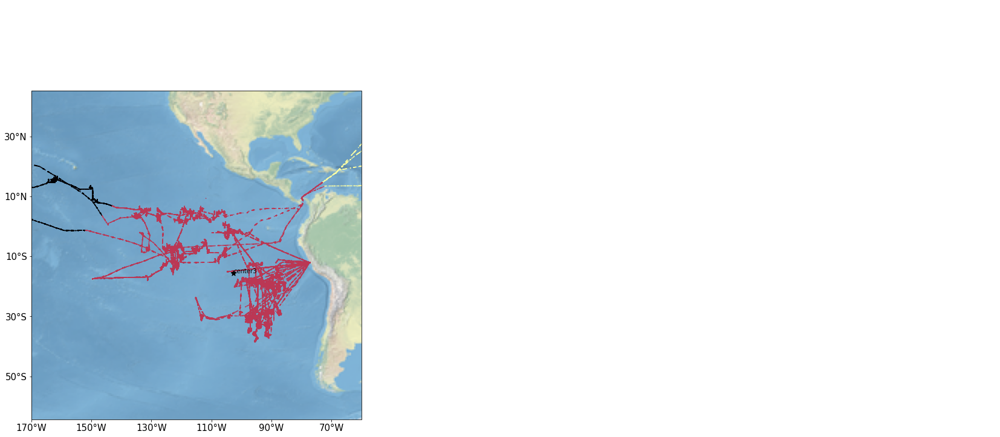

In [17]:

fig = plt.figure(figsize=(16, 10))  

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

extent = [-170, -60, -50, 30]

dx = 20
dy = 20
offset = min(dx, dy)

xticks = np.arange(extent[0], extent[1] + offset, dx)  
yticks = np.arange(extent[2], extent[3] + offset, dy)  

ax.set_xticks(xticks, crs=ccrs.PlateCarree())
ax.set_yticks(yticks, crs=ccrs.PlateCarree())

ax.tick_params(labelsize=15)

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.set_extent(extent)

plt.scatter(X[:,1],X[:,0],
            s = 0.4,c=C_i,
            cmap=plt.cm.inferno,
            transform=ccrs.Geodetic(),
           )


plt.scatter(Muk[:,1],Muk[:,0],
            marker='*',s=80,color = 'k',
            transform=ccrs.Geodetic(),
           )

for i in range(k):
    plt.annotate('center'+str(i + 1),(Muk[i,1],Muk[i,0]))
plt.show()

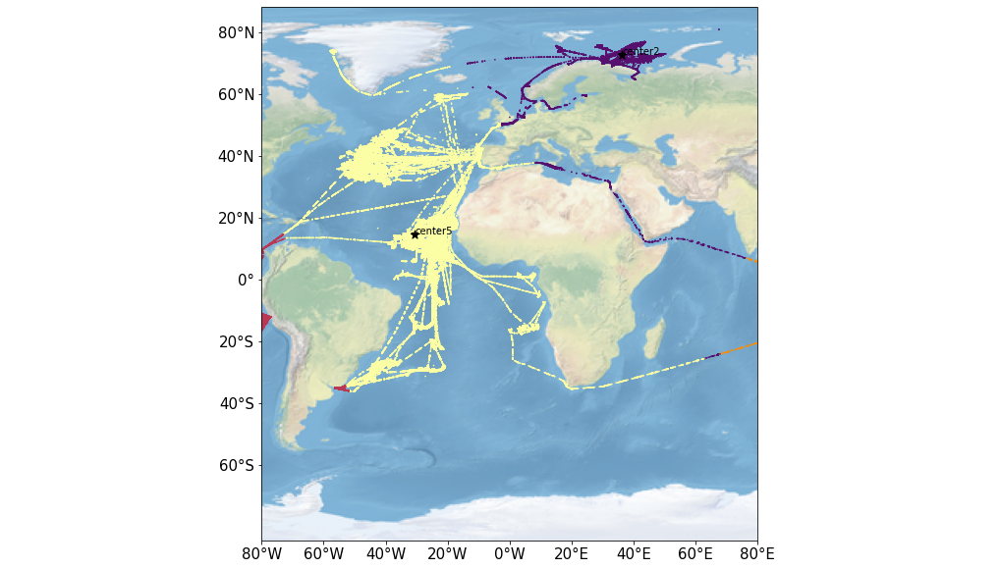

In [18]:

fig = plt.figure(figsize=(16, 10))  

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

extent = [-80, 80, -60, 80]

dx = 20
dy = 20
offset = min(dx, dy)

xticks = np.arange(extent[0], extent[1] + offset, dx)  
yticks = np.arange(extent[2], extent[3] + offset, dy)  

ax.set_xticks(xticks, crs=ccrs.PlateCarree())
ax.set_yticks(yticks, crs=ccrs.PlateCarree())

ax.tick_params(labelsize=15)

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.set_extent(extent)

plt.scatter(X[:,1],X[:,0],
            s = 0.4,c=C_i,
            cmap=plt.cm.inferno,
            transform=ccrs.Geodetic(),
           )


plt.scatter(Muk[:,1],Muk[:,0],
            marker='*',s=80,color = 'k',
            transform=ccrs.Geodetic(),
           )

for i in range(k):
    plt.annotate('center'+str(i + 1),(Muk[i,1],Muk[i,0]))
plt.show()

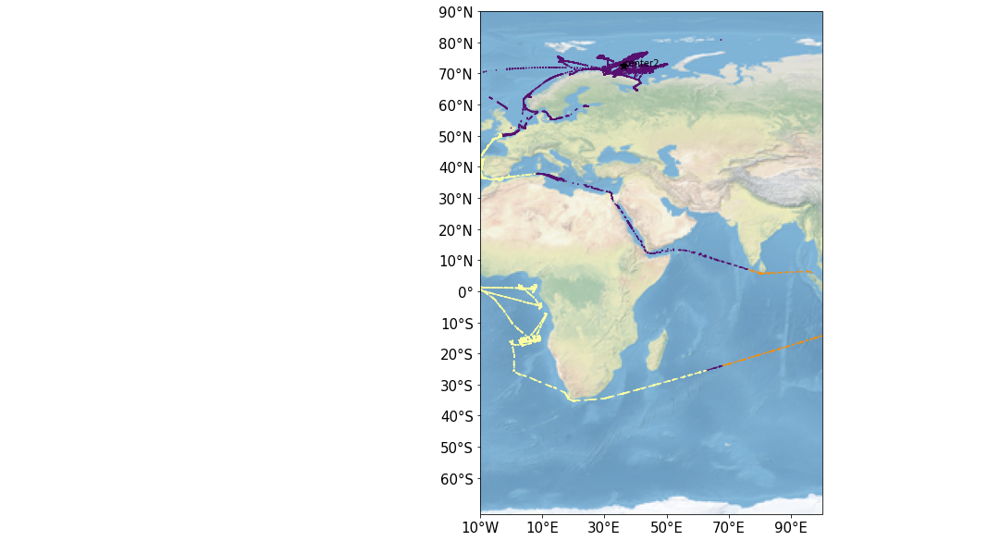

In [19]:

fig = plt.figure(figsize=(16, 10))  

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

extent = [-10, 100, -60, 90]

dx = 20
dy = 10
offset = min(dx, dy)

xticks = np.arange(extent[0], extent[1] + offset, dx)  
yticks = np.arange(extent[2], extent[3] + offset, dy)  

ax.set_xticks(xticks, crs=ccrs.PlateCarree())
ax.set_yticks(yticks, crs=ccrs.PlateCarree())

ax.tick_params(labelsize=15)

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.set_extent(extent)

plt.scatter(X[:,1],X[:,0],
            s = 0.4,c=C_i,
            cmap=plt.cm.inferno,
            transform=ccrs.Geodetic(),
           )


plt.scatter(Muk[:,1],Muk[:,0],
            marker='*',s=80,color = 'k',
            transform=ccrs.Geodetic(),
           )

for i in range(k):
    plt.annotate('center'+str(i + 1),(Muk[i,1],Muk[i,0]))
plt.show()

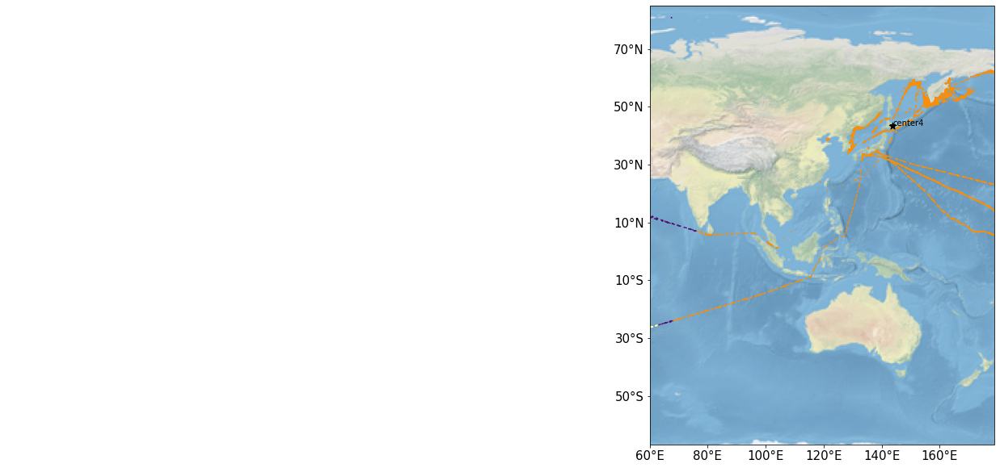

In [20]:

fig = plt.figure(figsize=(16, 10))  

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

extent = [60, 179, -50, 80]

dx = 20
dy = 20
offset = min(dx, dy)

xticks = np.arange(extent[0], extent[1] + offset, dx)  
yticks = np.arange(extent[2], extent[3] + offset, dy)  

ax.set_xticks(xticks, crs=ccrs.PlateCarree())
ax.set_yticks(yticks, crs=ccrs.PlateCarree())

ax.tick_params(labelsize=15)

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.set_extent(extent)

plt.scatter(X[:,1],X[:,0],
            s = 0.4,c=C_i,
            cmap=plt.cm.inferno,
            transform=ccrs.Geodetic(),
           )


plt.scatter(Muk[:,1],Muk[:,0],
            marker='*',s=80,color = 'k',
            transform=ccrs.Geodetic(),
           )

for i in range(k):
    plt.annotate('center'+str(i + 1),(Muk[i,1],Muk[i,0]))
plt.show()

In [21]:
from collections import Counter

In [22]:
df_use.head()

,lat,lon
0,14.865583,-26.853662
1,14.863870,-26.856800
2,14.861551,-26.860649
3,14.822686,-26.865898
4,14.821825,-26.867579


In [23]:
df_use2 = df_data[['lat','lon','timestamp']]

In [24]:
df_use2.head()

,lat,lon,timestamp
0,14.865583,-26.853662,1327136504
1,14.863870,-26.856800,1327136605
2,14.861551,-26.860649,1327136734
3,14.822686,-26.865898,1327143281
4,14.821825,-26.867579,1327143341


In [25]:
df_use2.dropna(inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


In [26]:
df_use2.isnull().sum()

lat          0
lon          0
timestamp    0
dtype: int64

In [27]:
from datetime import datetime


timestamp = 1545730073
dt_obj = datetime.fromtimestamp(timestamp).strftime('%d-%m-%y')
print("date:",dt_obj)


date: 25-12-18


In [28]:
df_use2['timestamp']=[datetime.fromtimestamp(i).strftime('%m') for i in df_use2['timestamp'] ]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [29]:
df_use2

,lat,lon,timestamp
0,14.865583,-26.853662,01
1,14.863870,-26.856800,01
2,14.861551,-26.860649,01
3,14.822686,-26.865898,01
4,14.821825,-26.867579,01
...,...,...,...
1048570,-26.913244,-41.541027,08
1048571,-26.905119,-41.535133,08
1048572,-26.903206,-41.533554,08
1048573,-26.896179,-41.528385,08


In [30]:
new_data1 = df_use2[df_use2['timestamp'] == '01']
new_data2 = df_use2[df_use2['timestamp'] == '02']
new_data3 = df_use2[df_use2['timestamp'] == '03']
new_data4 = df_use2[df_use2['timestamp'] == '04']
new_data5 = df_use2[df_use2['timestamp'] == '04']
new_data6 = df_use2[df_use2['timestamp'] == '05']
new_data7 = df_use2[df_use2['timestamp'] == '06']
new_data8 = df_use2[df_use2['timestamp'] == '07']

In [31]:
new_data1

,lat,lon,timestamp
0,14.865583,-26.853662,01
1,14.863870,-26.856800,01
2,14.861551,-26.860649,01
3,14.822686,-26.865898,01
4,14.821825,-26.867579,01
...,...,...,...
1022372,3.389168,-21.653505,01
1022373,3.392705,-21.654116,01
1022374,3.392705,-21.654116,01
1022375,3.435570,-21.664780,01


In [32]:
data_01 = new_data1.drop(['timestamp'],axis=1)
data_02 = new_data2.drop(['timestamp'],axis=1)
data_03 = new_data3.drop(['timestamp'],axis=1)
data_04 = new_data4.drop(['timestamp'],axis=1)
data_05 = new_data5.drop(['timestamp'],axis=1)
data_06 = new_data6.drop(['timestamp'],axis=1)
data_07 = new_data7.drop(['timestamp'],axis=1)
data_08 = new_data8.drop(['timestamp'],axis=1)

In [33]:
data_01

,lat,lon
0,14.865583,-26.853662
1,14.863870,-26.856800
2,14.861551,-26.860649
3,14.822686,-26.865898
4,14.821825,-26.867579
...,...,...
1022372,3.389168,-21.653505
1022373,3.392705,-21.654116
1022374,3.392705,-21.654116
1022375,3.435570,-21.664780


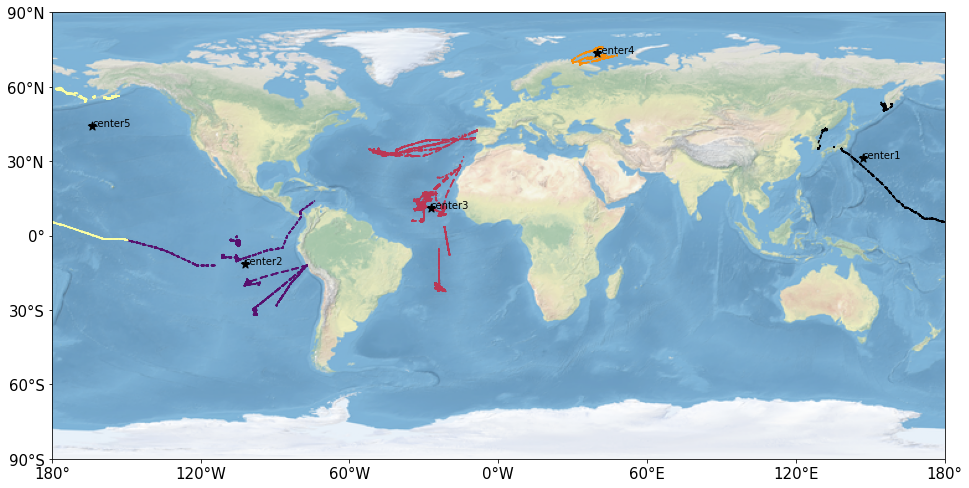

In [34]:
#for the month '01'


X_01 = data_01.to_numpy()

k = 5

model_01 = KMeans(n_clusters = k)

model_01.fit(X_01)

C_i1 = model_01.predict(X_01)

Muk1 = model_01.cluster_centers_




fig = plt.figure(figsize=(16, 10))  

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

extent = [-180, 180, -90, 90]

dx = 60
dy = 30
offset = min(dx, dy)

xticks = np.arange(extent[0], extent[1] + offset, dx)  
yticks = np.arange(extent[2], extent[3] + offset, dy)  

ax.set_xticks(xticks, crs=ccrs.PlateCarree())
ax.set_yticks(yticks, crs=ccrs.PlateCarree())

ax.tick_params(labelsize=15)

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.set_extent(extent)

plt.scatter(X_01[:,1],X_01[:,0],
            s = 0.4,c=C_i1,
            cmap=plt.cm.inferno,
            transform=ccrs.Geodetic(),
           )


plt.scatter(Muk1[:,1],Muk1[:,0],
            marker='*',s=80,color = 'k',
            transform=ccrs.Geodetic(),
           )

for i in range(k):
    plt.annotate('center'+str(i + 1),(Muk1[i,1],Muk1[i,0]))
plt.show()

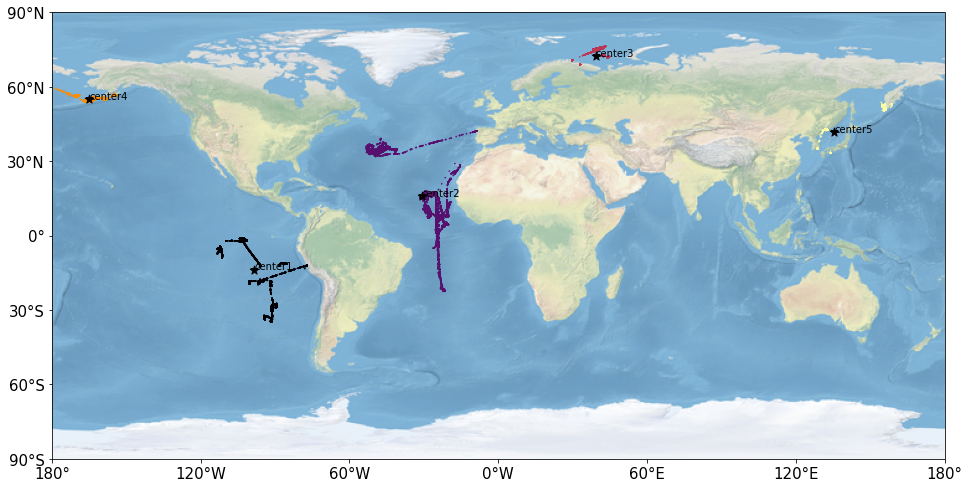

In [35]:
#for the month '02'


X_02 = data_02.to_numpy()

k = 5

model_02 = KMeans(n_clusters = k)

model_02.fit(X_02)

C_i2 = model_02.predict(X_02)

Muk2 = model_02.cluster_centers_




fig = plt.figure(figsize=(16, 10))  

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

extent = [-180, 180, -90, 90]

dx = 60
dy = 30
offset = min(dx, dy)

xticks = np.arange(extent[0], extent[1] + offset, dx)  
yticks = np.arange(extent[2], extent[3] + offset, dy)  

ax.set_xticks(xticks, crs=ccrs.PlateCarree())
ax.set_yticks(yticks, crs=ccrs.PlateCarree())

ax.tick_params(labelsize=15)

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.set_extent(extent)

plt.scatter(X_02[:,1],X_02[:,0],
            s = 0.4,c=C_i2,
            cmap=plt.cm.inferno,
            transform=ccrs.Geodetic(),
           )


plt.scatter(Muk2[:,1],Muk2[:,0],
            marker='*',s=80,color = 'k',
            transform=ccrs.Geodetic(),
           )

for i in range(k):
    plt.annotate('center'+str(i + 1),(Muk2[i,1],Muk2[i,0]))
plt.show()

In [ ]:
#fig3 = px.scatter(df_data, x = "lat", y = "lon", color = 'timestamp')
#fig3.update_layout(title = "3 features Representation")
#fig3.show()

In [36]:
df_use3 = df_data[['lat','lon','timestamp', 'speed']]

In [37]:
df_use3['timestamp']=[datetime.fromtimestamp(i).strftime('%m') for i in df_use3['timestamp'] ]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [38]:
df_use3

,lat,lon,timestamp,speed
0,14.865583,-26.853662,01,8.2
1,14.863870,-26.856800,01,7.3
2,14.861551,-26.860649,01,6.8
3,14.822686,-26.865898,01,6.9
4,14.821825,-26.867579,01,6.1
...,...,...,...,...
1048570,-26.913244,-41.541027,08,7.9
1048571,-26.905119,-41.535133,08,8.3
1048572,-26.903206,-41.533554,08,8.0
1048573,-26.896179,-41.528385,08,8.6


In [39]:
newData_1 = df_use3[df_use3['timestamp'] == '01']

In [40]:
newData_1

,lat,lon,timestamp,speed
0,14.865583,-26.853662,01,8.2
1,14.863870,-26.856800,01,7.3
2,14.861551,-26.860649,01,6.8
3,14.822686,-26.865898,01,6.9
4,14.821825,-26.867579,01,6.1
...,...,...,...,...
1022372,3.389168,-21.653505,01,10.3
1022373,3.392705,-21.654116,01,10.0
1022374,3.392705,-21.654116,01,10.0
1022375,3.435570,-21.664780,01,9.8


# **2**-**D** **Visualization**

In [47]:
fig2 = px.scatter(newData_1, x = "lat", y = "lon", color = 'speed', range_color = (0, 13))
fig2.update_layout(title = "3 features Representation")
fig2.show()

# **3-D Visualization**

In [52]:
#including 'course' as a feature

df_use4 = df_data[['lat','lon','timestamp', 'speed', 'course']]

In [53]:
df_use4['timestamp']=[datetime.fromtimestamp(i).strftime('%m') for i in df_use4['timestamp'] ]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [54]:
df_use4

,lat,lon,timestamp,speed,course
0,14.865583,-26.853662,01,8.2,230.500000
1,14.863870,-26.856800,01,7.3,238.399994
2,14.861551,-26.860649,01,6.8,238.899994
3,14.822686,-26.865898,01,6.9,251.800003
4,14.821825,-26.867579,01,6.1,231.100006
...,...,...,...,...,...
1048570,-26.913244,-41.541027,08,7.9,30.500000
1048571,-26.905119,-41.535133,08,8.3,27.400000
1048572,-26.903206,-41.533554,08,8.0,38.400002
1048573,-26.896179,-41.528385,08,8.6,12.600000


In [55]:
newData_2 = df_use4[df_use4['timestamp'] == '01']

In [56]:
newData_2

,lat,lon,timestamp,speed,course
0,14.865583,-26.853662,01,8.2,230.500000
1,14.863870,-26.856800,01,7.3,238.399994
2,14.861551,-26.860649,01,6.8,238.899994
3,14.822686,-26.865898,01,6.9,251.800003
4,14.821825,-26.867579,01,6.1,231.100006
...,...,...,...,...,...
1022372,3.389168,-21.653505,01,10.3,346.600006
1022373,3.392705,-21.654116,01,10.0,344.899994
1022374,3.392705,-21.654116,01,10.0,344.899994
1022375,3.435570,-21.664780,01,9.8,347.600006


In [57]:
fig3 = px.scatter_3d(newData_2, x = "lat", y = "lon", z = 'course', color = 'speed', range_color = (0, 13))
fig3.update_layout(title = "4 features Representation")
fig3.show()

In [58]:
#including 'distance from port' as a feature

df_use5 = df_data[['lat','lon','timestamp', 'speed', 'distance_from_port']]

df_use5['timestamp']=[datetime.fromtimestamp(i).strftime('%m') for i in df_use5['timestamp'] ]


df_use5

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,lat,lon,timestamp,speed,distance_from_port
0,14.865583,-26.853662,01,8.2,311748.6563
1,14.863870,-26.856800,01,7.3,312410.3438
2,14.861551,-26.860649,01,6.8,312410.3438
3,14.822686,-26.865898,01,6.9,315417.3750
4,14.821825,-26.867579,01,6.1,316172.5625
...,...,...,...,...,...
1048570,-26.913244,-41.541027,08,7.9,486881.2813
1048571,-26.905119,-41.535133,08,8.3,485997.3125
1048572,-26.903206,-41.533554,08,8.0,485997.3125
1048573,-26.896179,-41.528385,08,8.6,485003.5625


In [60]:
newData_3 = df_use5[df_use5['timestamp'] == '01']

In [62]:
newData_3

,lat,lon,timestamp,speed,distance_from_port
0,14.865583,-26.853662,01,8.2,3.117487e+05
1,14.863870,-26.856800,01,7.3,3.124103e+05
2,14.861551,-26.860649,01,6.8,3.124103e+05
3,14.822686,-26.865898,01,6.9,3.154174e+05
4,14.821825,-26.867579,01,6.1,3.161726e+05
...,...,...,...,...,...
1022372,3.389168,-21.653505,01,10.3,1.097768e+06
1022373,3.392705,-21.654116,01,10.0,1.097768e+06
1022374,3.392705,-21.654116,01,10.0,1.097768e+06
1022375,3.435570,-21.664780,01,9.8,1.096026e+06


In [64]:
fig3 = px.scatter_3d(newData_3, x = "lat", y = "lon", z = 'distance_from_port', color = 'speed', range_color = (0, 13))
fig3.update_layout(title = "4 features Representation")
fig3.show()

In [65]:
fig3 = px.scatter_3d(newData_3, x = "lat", y = "lon", z = 'speed', color = 'distance_from_port')
fig3.update_layout(title = "4 features Representation")
fig3.show()